STANDALONE MISCLASSIFICATION ANALYSIS

[STEP 1] Setting up paths...
✓ Output will be saved to: C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\misclassification_analysis

[STEP 2] Verifying files...
✓ Found 1092 test images
✓ Found 1092 ground truth label files
✓ Found 1085 prediction label files

[STEP 3] Loading predictions and ground truth...

Analyzing 1092 images...
  Processed 0/1092 images...
  Processed 50/1092 images...
  Processed 100/1092 images...
  Processed 150/1092 images...
  Processed 200/1092 images...
  Processed 250/1092 images...
  Processed 300/1092 images...
  Processed 350/1092 images...
  Processed 400/1092 images...
  Processed 450/1092 images...
  Processed 500/1092 images...
  Processed 550/1092 images...
  Processed 600/1092 images...
  Processed 650/1092 images...
  Processed 700/1092 images...
  Processed 750/1092 images...
  Processed 800/1092 images...
  Processed 850/1092 images...
  Processed 900/1092 images...
  Processed 950/1092 

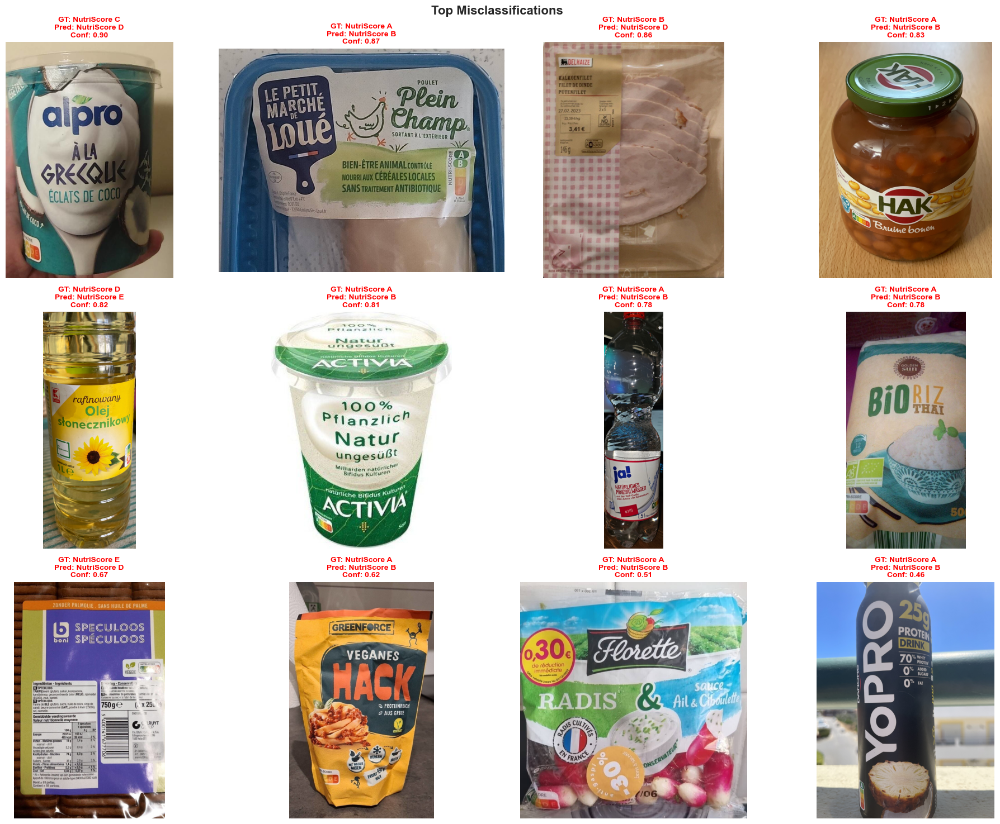


[STEP 7] Creating missed detection visualizations...
✓ Saved: C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\misclassification_analysis\missed_detections.png


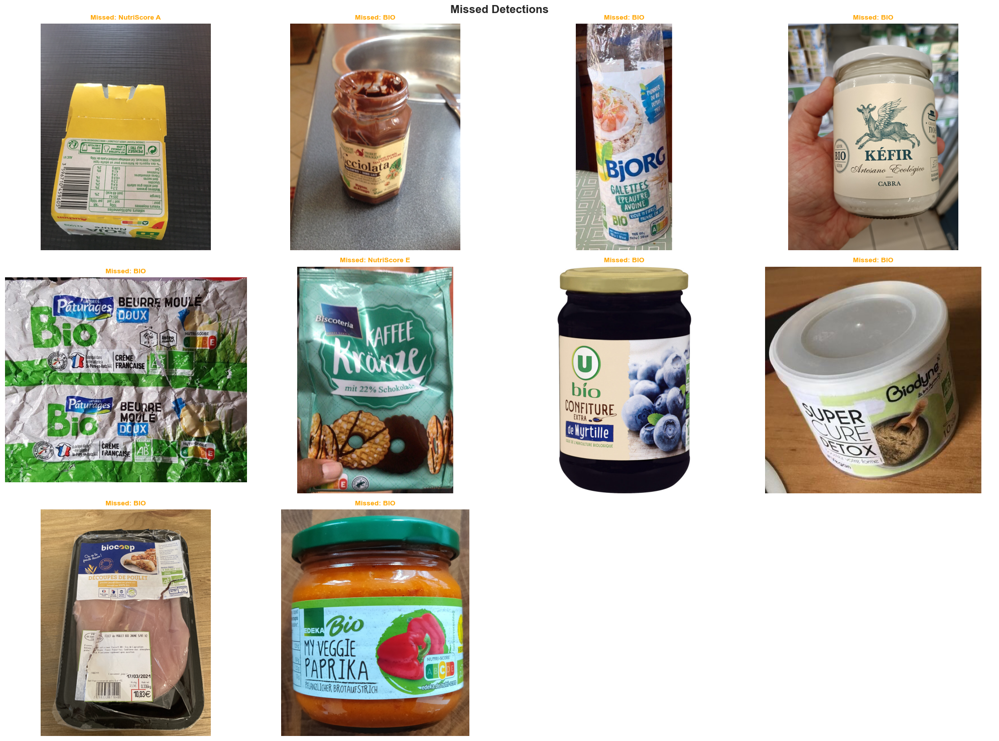


[STEP 8] Creating false positive visualizations...
✓ Saved: C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\misclassification_analysis\false_positives.png


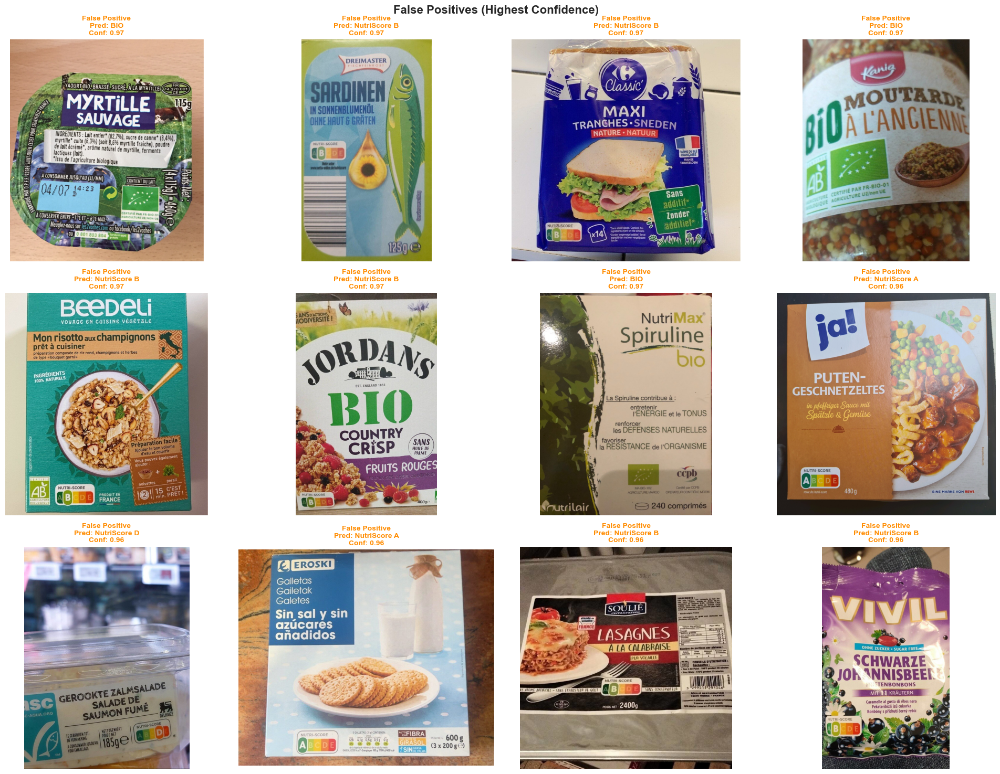


[STEP 9] Creating summary charts...
✓ Saved: C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\misclassification_analysis\summary.png


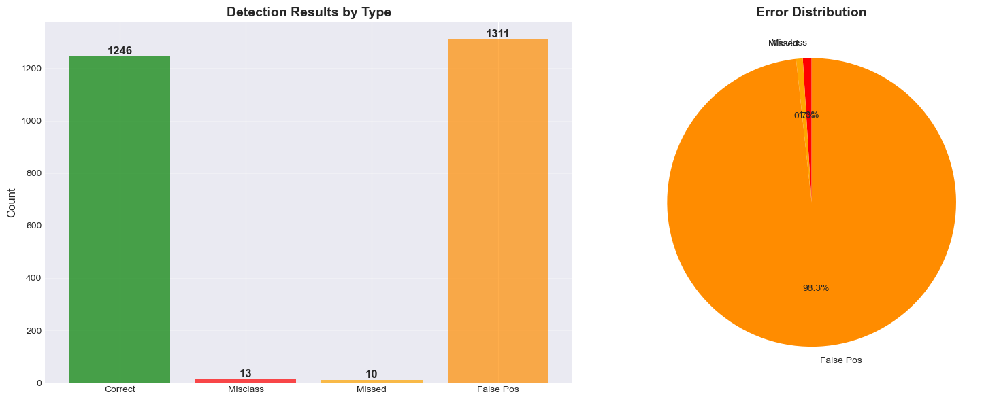


ANALYSIS COMPLETE!

📁 All results saved to: C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset\runs\misclassification_analysis

Generated files:
  1. error_report.csv - Detailed CSV with all errors
  2. misclassifications.png - Visual examples of wrong classifications
  3. missed_detections.png - Objects the model missed
  4. false_positives.png - Extra detections (not in ground truth)
  5. summary.png - Overall statistics

📊 Quick Stats:
  Total images: 1092
  Correct: 1246
  Errors: 1334
  Accuracy: 99.0%

💡 What to do next:
  ⚠ High number of false positives!
  → Likely caused by low confidence threshold
  → Re-run detection with --conf 0.4 or 0.5



In [5]:
"""
STANDALONE MISCLASSIFICATION ANALYSIS NOTEBOOK
Run this AFTER you've completed model evaluation

This notebook will:
1. Compare predictions vs ground truth
2. Find misclassifications
3. Find missed detections
4. Find false positives
5. Create visualizations and reports
"""

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print("=" * 80)
print("STANDALONE MISCLASSIFICATION ANALYSIS")
print("=" * 80)

# ============================================================================
# STEP 1: SETUP PATHS
# ============================================================================
print("\n[STEP 1] Setting up paths...")

BASE_DIR = Path(r"C:\Users\lokes\Desktop\ironhack\final_project\dataset\dataset")
YOLO_DIR = BASE_DIR / "yolov5_data"
RUNS_DIR = BASE_DIR / "runs"

# Where ground truth is
TEST_LABELS_DIR = YOLO_DIR / 'test' / 'labels'
TEST_IMAGES_DIR = YOLO_DIR / 'test' / 'images'

# Where predictions are (from detection run)
PRED_LABELS_DIR = RUNS_DIR / 'nutrigreen_detections' / 'labels'

# Where to save results
OUTPUT_DIR = RUNS_DIR / 'misclassification_analysis'
OUTPUT_DIR.mkdir(exist_ok=True)

print(f"✓ Output will be saved to: {OUTPUT_DIR}")

# Class names
CLASS_NAMES = {
    0: 'NutriScore A',
    1: 'NutriScore B',
    2: 'NutriScore C',
    3: 'NutriScore D',
    4: 'NutriScore E',
    5: 'BIO',
    6: 'V-Label'
}

# ============================================================================
# STEP 2: VERIFY FILES EXIST
# ============================================================================
print("\n[STEP 2] Verifying files...")

if not TEST_LABELS_DIR.exists():
    print(f"❌ Ground truth labels not found: {TEST_LABELS_DIR}")
    print("   Run the EDA notebook first!")
    exit()

if not PRED_LABELS_DIR.exists():
    print(f"❌ Prediction labels not found: {PRED_LABELS_DIR}")
    print("   Run detection first in evaluation notebook!")
    exit()

n_test_images = len(list(TEST_IMAGES_DIR.glob('*.jpg')))
n_gt_labels = len(list(TEST_LABELS_DIR.glob('*.txt')))
n_pred_labels = len(list(PRED_LABELS_DIR.glob('*.txt')))

print(f"✓ Found {n_test_images} test images")
print(f"✓ Found {n_gt_labels} ground truth label files")
print(f"✓ Found {n_pred_labels} prediction label files")

if n_gt_labels == 0 or n_pred_labels == 0:
    print("\n❌ Missing required files!")
    exit()

# ============================================================================
# STEP 3: LOAD ALL PREDICTIONS AND GROUND TRUTH
# ============================================================================
print("\n[STEP 3] Loading predictions and ground truth...")

def load_yolo_labels(label_path):
    """Load YOLO format labels from a file"""
    boxes = []
    if not label_path.exists():
        return boxes
    
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) >= 5:
                class_id = int(parts[0])
                x_center = float(parts[1])
                y_center = float(parts[2])
                width = float(parts[3])
                height = float(parts[4])
                conf = float(parts[5]) if len(parts) > 5 else 1.0
                
                boxes.append({
                    'class': class_id,
                    'x': x_center,
                    'y': y_center,
                    'w': width,
                    'h': height,
                    'conf': conf
                })
    return boxes

def calculate_iou(box1, box2):
    """Calculate IoU between two boxes"""
    # Convert center format to corner format
    x1_min = box1['x'] - box1['w']/2
    y1_min = box1['y'] - box1['h']/2
    x1_max = box1['x'] + box1['w']/2
    y1_max = box1['y'] + box1['h']/2
    
    x2_min = box2['x'] - box2['w']/2
    y2_min = box2['y'] - box2['h']/2
    x2_max = box2['x'] + box2['w']/2
    y2_max = box2['y'] + box2['h']/2
    
    # Calculate intersection
    inter_x_min = max(x1_min, x2_min)
    inter_y_min = max(y1_min, y2_min)
    inter_x_max = min(x1_max, x2_max)
    inter_y_max = min(y1_max, y2_max)
    
    if inter_x_max < inter_x_min or inter_y_max < inter_y_min:
        return 0.0
    
    inter_area = (inter_x_max - inter_x_min) * (inter_y_max - inter_y_min)
    box1_area = box1['w'] * box1['h']
    box2_area = box2['w'] * box2['h']
    union_area = box1_area + box2_area - inter_area
    
    return inter_area / union_area if union_area > 0 else 0

# Analyze all test images
all_results = []
correct_detections = []
misclassifications = []
false_negatives = []
false_positives = []

test_images = list(TEST_IMAGES_DIR.glob('*.jpg'))
print(f"\nAnalyzing {len(test_images)} images...")

for i, img_path in enumerate(test_images):
    if i % 50 == 0:
        print(f"  Processed {i}/{len(test_images)} images...")
    
    img_name = img_path.stem
    
    # Load ground truth and predictions
    gt_boxes = load_yolo_labels(TEST_LABELS_DIR / f"{img_name}.txt")
    pred_boxes = load_yolo_labels(PRED_LABELS_DIR / f"{img_name}.txt")
    
    # Match predictions to ground truth using IoU
    matched_gt = set()
    matched_pred = set()
    
    IOU_THRESHOLD = 0.3  # Lower threshold to catch more matches
    
    for gt_idx, gt_box in enumerate(gt_boxes):
        best_iou = 0
        best_pred_idx = -1
        
        for pred_idx, pred_box in enumerate(pred_boxes):
            if pred_idx in matched_pred:
                continue
            
            iou = calculate_iou(gt_box, pred_box)
            if iou > best_iou:
                best_iou = iou
                best_pred_idx = pred_idx
        
        # If we found a match
        if best_iou > IOU_THRESHOLD and best_pred_idx != -1:
            matched_gt.add(gt_idx)
            matched_pred.add(best_pred_idx)
            
            pred_box = pred_boxes[best_pred_idx]
            
            # Check if classes match
            if gt_box['class'] == pred_box['class']:
                # Correct detection
                correct_detections.append({
                    'image': img_name,
                    'gt_class': gt_box['class'],
                    'pred_class': pred_box['class'],
                    'confidence': pred_box['conf'],
                    'iou': best_iou
                })
            else:
                # Misclassification
                misclassifications.append({
                    'image': img_name,
                    'gt_class': gt_box['class'],
                    'pred_class': pred_box['class'],
                    'confidence': pred_box['conf'],
                    'iou': best_iou,
                    'image_path': img_path
                })
    
    # False negatives (GT boxes that weren't matched)
    for gt_idx, gt_box in enumerate(gt_boxes):
        if gt_idx not in matched_gt:
            false_negatives.append({
                'image': img_name,
                'gt_class': gt_box['class'],
                'image_path': img_path
            })
    
    # False positives (Predictions that weren't matched)
    for pred_idx, pred_box in enumerate(pred_boxes):
        if pred_idx not in matched_pred:
            false_positives.append({
                'image': img_name,
                'pred_class': pred_box['class'],
                'confidence': pred_box['conf'],
                'image_path': img_path
            })

print(f"✓ Analysis complete!")

# ============================================================================
# STEP 4: DISPLAY RESULTS
# ============================================================================
print("\n" + "=" * 80)
print("[STEP 4] RESULTS SUMMARY")
print("=" * 80)

print(f"\nTotal test images analyzed: {len(test_images)}")
print(f"\n📊 Detection Results:")
print(f"  ✅ Correct detections:     {len(correct_detections)}")
print(f"  ❌ Misclassifications:     {len(misclassifications)}")
print(f"  🔴 Missed detections:      {len(false_negatives)}")
print(f"  🟠 False positives:        {len(false_positives)}")

total_detections = len(correct_detections) + len(misclassifications)
if total_detections > 0:
    accuracy = len(correct_detections) / total_detections * 100
    print(f"\n  Classification Accuracy: {accuracy:.1f}%")

# ============================================================================
# STEP 5: CREATE DETAILED REPORT CSV
# ============================================================================
print("\n[STEP 5] Creating detailed report...")

report_rows = []

# Add correct detections
for item in correct_detections:
    report_rows.append({
        'Type': 'Correct',
        'Image': item['image'],
        'True_Class': CLASS_NAMES[item['gt_class']],
        'Predicted_Class': CLASS_NAMES[item['pred_class']],
        'Confidence': f"{item['confidence']:.3f}",
        'IoU': f"{item['iou']:.3f}"
    })

# Add misclassifications
for item in misclassifications:
    report_rows.append({
        'Type': 'Misclassification',
        'Image': item['image'],
        'True_Class': CLASS_NAMES[item['gt_class']],
        'Predicted_Class': CLASS_NAMES[item['pred_class']],
        'Confidence': f"{item['confidence']:.3f}",
        'IoU': f"{item['iou']:.3f}"
    })

# Add false negatives
for item in false_negatives:
    report_rows.append({
        'Type': 'Missed',
        'Image': item['image'],
        'True_Class': CLASS_NAMES[item['gt_class']],
        'Predicted_Class': 'None',
        'Confidence': 'N/A',
        'IoU': 'N/A'
    })

# Add false positives
for item in false_positives:
    report_rows.append({
        'Type': 'False Positive',
        'Image': item['image'],
        'True_Class': 'None',
        'Predicted_Class': CLASS_NAMES[item['pred_class']],
        'Confidence': f"{item['confidence']:.3f}",
        'IoU': 'N/A'
    })

report_df = pd.DataFrame(report_rows)
report_path = OUTPUT_DIR / 'error_report.csv'
report_df.to_csv(report_path, index=False)
print(f"✓ Saved detailed report: {report_path}")

# Show sample
print("\nSample from report:")
print(report_df.head(10).to_string(index=False))

# ============================================================================
# STEP 6: VISUALIZE MISCLASSIFICATIONS
# ============================================================================
print("\n[STEP 6] Creating misclassification visualizations...")

if len(misclassifications) > 0:
    # Sort by confidence
    misclassifications_sorted = sorted(misclassifications, key=lambda x: x['confidence'], reverse=True)
    
    # Show top 12
    n_show = min(12, len(misclassifications_sorted))
    
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    axes = axes.flatten()
    
    for idx in range(n_show):
        item = misclassifications_sorted[idx]
        img = Image.open(item['image_path'])
        axes[idx].imshow(img)
        axes[idx].axis('off')
        
        title = f"GT: {CLASS_NAMES[item['gt_class']]}\n"
        title += f"Pred: {CLASS_NAMES[item['pred_class']]}\n"
        title += f"Conf: {item['confidence']:.2f}"
        axes[idx].set_title(title, fontsize=10, color='red', fontweight='bold')
    
    for idx in range(n_show, 12):
        axes[idx].axis('off')
    
    plt.suptitle('Top Misclassifications', fontsize=16, fontweight='bold')
    plt.tight_layout()
    misclass_path = OUTPUT_DIR / 'misclassifications.png'
    plt.savefig(misclass_path, dpi=200, bbox_inches='tight')
    print(f"✓ Saved: {misclass_path}")
    plt.show()
else:
    print("  No misclassifications found!")

# ============================================================================
# STEP 7: VISUALIZE MISSED DETECTIONS
# ============================================================================
print("\n[STEP 7] Creating missed detection visualizations...")

if len(false_negatives) > 0:
    n_show = min(12, len(false_negatives))
    
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    axes = axes.flatten()
    
    for idx in range(n_show):
        item = false_negatives[idx]
        img = Image.open(item['image_path'])
        axes[idx].imshow(img)
        axes[idx].axis('off')
        
        title = f"Missed: {CLASS_NAMES[item['gt_class']]}"
        axes[idx].set_title(title, fontsize=10, color='orange', fontweight='bold')
    
    for idx in range(n_show, 12):
        axes[idx].axis('off')
    
    plt.suptitle('Missed Detections', fontsize=16, fontweight='bold')
    plt.tight_layout()
    missed_path = OUTPUT_DIR / 'missed_detections.png'
    plt.savefig(missed_path, dpi=200, bbox_inches='tight')
    print(f"✓ Saved: {missed_path}")
    plt.show()
else:
    print("  No missed detections!")

# ============================================================================
# STEP 8: VISUALIZE FALSE POSITIVES
# ============================================================================
print("\n[STEP 8] Creating false positive visualizations...")

if len(false_positives) > 0:
    # Sort by confidence
    fp_sorted = sorted(false_positives, key=lambda x: x['confidence'], reverse=True)
    
    n_show = min(12, len(fp_sorted))
    
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    axes = axes.flatten()
    
    for idx in range(n_show):
        item = fp_sorted[idx]
        img = Image.open(item['image_path'])
        axes[idx].imshow(img)
        axes[idx].axis('off')
        
        title = f"False Positive\n"
        title += f"Pred: {CLASS_NAMES[item['pred_class']]}\n"
        title += f"Conf: {item['confidence']:.2f}"
        axes[idx].set_title(title, fontsize=10, color='darkorange', fontweight='bold')
    
    for idx in range(n_show, 12):
        axes[idx].axis('off')
    
    plt.suptitle('False Positives (Highest Confidence)', fontsize=16, fontweight='bold')
    plt.tight_layout()
    fp_path = OUTPUT_DIR / 'false_positives.png'
    plt.savefig(fp_path, dpi=200, bbox_inches='tight')
    print(f"✓ Saved: {fp_path}")
    plt.show()
else:
    print("  No false positives!")

# ============================================================================
# STEP 9: CREATE SUMMARY CHARTS
# ============================================================================
print("\n[STEP 9] Creating summary charts...")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Error type distribution
error_types = ['Correct', 'Misclass', 'Missed', 'False Pos']
error_counts = [
    len(correct_detections),
    len(misclassifications),
    len(false_negatives),
    len(false_positives)
]
colors = ['green', 'red', 'orange', 'darkorange']

bars = axes[0].bar(error_types, error_counts, color=colors, alpha=0.7)
axes[0].set_ylabel('Count', fontsize=12)
axes[0].set_title('Detection Results by Type', fontsize=14, fontweight='bold')
axes[0].grid(axis='y', alpha=0.3)

for bar, count in zip(bars, error_counts):
    height = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width()/2., height,
                f'{int(count)}',
                ha='center', va='bottom', fontweight='bold', fontsize=12)

# Error breakdown pie chart
if sum(error_counts[1:]) > 0:  # If there are any errors
    error_pie = axes[1].pie(error_counts[1:], labels=error_types[1:], 
                           autopct='%1.1f%%', startangle=90, colors=colors[1:])
    axes[1].set_title('Error Distribution', fontsize=14, fontweight='bold')
else:
    axes[1].text(0.5, 0.5, 'No Errors!', ha='center', va='center', 
                fontsize=20, fontweight='bold')
    axes[1].axis('off')

plt.tight_layout()
summary_path = OUTPUT_DIR / 'summary.png'
plt.savefig(summary_path, dpi=200, bbox_inches='tight')
print(f"✓ Saved: {summary_path}")
plt.show()

# ============================================================================
# STEP 10: FINAL SUMMARY
# ============================================================================
print("\n" + "=" * 80)
print("ANALYSIS COMPLETE!")
print("=" * 80)

print(f"\n📁 All results saved to: {OUTPUT_DIR}")
print(f"\nGenerated files:")
print(f"  1. error_report.csv - Detailed CSV with all errors")
print(f"  2. misclassifications.png - Visual examples of wrong classifications")
print(f"  3. missed_detections.png - Objects the model missed")
print(f"  4. false_positives.png - Extra detections (not in ground truth)")
print(f"  5. summary.png - Overall statistics")

print(f"\n📊 Quick Stats:")
print(f"  Total images: {len(test_images)}")
print(f"  Correct: {len(correct_detections)}")
print(f"  Errors: {len(misclassifications) + len(false_negatives) + len(false_positives)}")

if total_detections > 0:
    print(f"  Accuracy: {accuracy:.1f}%")

print("\n💡 What to do next:")
if len(false_positives) > len(misclassifications) + len(false_negatives):
    print("  ⚠ High number of false positives!")
    print("  → Likely caused by low confidence threshold")
    print("  → Re-run detection with --conf 0.4 or 0.5")
elif len(misclassifications) > 10:
    print("  ⚠ Several misclassifications detected")
    print("  → Review the misclassifications.png")
    print("  → Consider more training data for confused classes")
elif len(false_negatives) > 10:
    print("  ⚠ Model missing several objects")
    print("  → Lower confidence threshold")
    print("  → Check if model needs more training")
else:
    print("  ✅ Model performing well!")
    print("  → Review the visualizations")
    print("  → Deploy with confidence!")

print("\n" + "=" * 80)